In [1]:
import torch
import numpy as np
import matplotlib.animation as animation
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torch.nn.utils import spectral_norm
from torchvision.datasets import MNIST
from torchvision.transforms import Normalize
from matplotlib import pyplot as plt
from torch.optim import Adam
from torch.optim.lr_scheduler import MultiStepLR
from tqdm import tqdm
from IPython.display import HTML, clear_output


# set this to 1 to train from scratch
# the whole notebook takes ~20 minutes to run on a single GPU
RUN_TRAINING = 0

#### Note 1: this notebook is to be run locally, not designed to run in Colab
#### Note 2: the ouputs of the cells were produced by running all cells one by one a single time

## Task 1

### Defining the modules

DCGAN stands for Deep Convolutional GAN. In the paper the authors provide an outline of the suggested architecture:

* Strided convolutions instead of pooling layers, strided transpose convolutions instead of upsampling layers.
* No fully-connected layers (this is weird actually, I looked into the pytorch DCGAN tutorial to clear this up, there they use a convolution as the last layer in the discriminator, but this convolution is equivalent to a fully-connected layer with one output channel anyway, so in my implementation I used a fully-connected layer there and as the first layer in the generator)
* ReLUs in the generators, LeakyReLUs in the discriminator (except on the output layer, tanh and sigmoid there respectively)
* Use batchnorm everywhee except generator ontput layer and discriminator input layer

Also they provide their choice of hyperparameters which I followed in this implementation. 

I also utilized some tricks for training GANs from Skoltech DL course and [ganhacks](https://github.com/soumith/ganhacks).

* Applying Spectral Norm to the weights in the Discriminator
* Adding dropout to the generator
* Adding noise which decays with the number of training iterations to real images
* Replacing hard labels (0 for fake, 1 for real) with noisy ones (0-0.3 for fake, 0.8-1.2 for real) in the BCELoss (details below)
* Training the generator and the discriminator for different numbers of iterations, ended up with 1 and 1.



The output of the Discriminator is interpreted as the probability $p(x)$ of the image $x$ being real. The objective for the discriminator therefore is $\max \mathbb{E}_{x \sim p_{data}}\log p(x) + \mathbb{E}_{z \sim \mathcal{N}(0,1)} \log(1 - p(G(z))$ which is to maximizw the probability of real images being classified as real and fake images being classified as fake. The objective for the generator is $\max \mathbb{E}_{z \sim \mathcal{N}(0,1)} \log(p(G(z))$ which to maximize the probability of fooling the generator. In the code  each term of the objectives can be implemented as the BCE Loss. 

More closely:
* $\log p(x) = BCELoss(p(x), 1)$
* $\log(1 - p(G(z)) = BCELoss(p(G(z)), 0)$
* $\log(p(G(z)) = BCELoss(p(G(z)), 1)$

In [2]:
# utility function to compute the shape of the output of Conv2d
def compute_shape(h_in, kernel_size, stride, padding):
    h_out = (h_in + 2 * padding - (kernel_size - 1) - 1) / stride + 1
    return int(h_out)

In [3]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ConvBlock, self).__init__()
        self.block = nn.Sequential(
            spectral_norm(nn.Conv2d(in_channels, out_channels, 3, stride=2, padding=1)),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2)
                                  )
    def forward(self, x):
        return self.block(x)
    
class ConvTransposeBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ConvTransposeBlock, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, 3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(out_channels),
            nn.Dropout(p=0.3),
            nn.ReLU()
                                  )
    def forward(self, x):
        return self.block(x)

In [4]:
class Discriminator(nn.Module):
    def __init__(self, c=64):
        super(Discriminator, self).__init__()
        self.c = c
        self.lin = nn.Linear(4 * 4 * 4*c, 1)
        self.convnet = nn.Sequential(
            nn.Conv2d(1, 2*c, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            ConvBlock(2*c, 2*c),
            ConvBlock(2*c, 4*c),
        )
    
    def forward(self, x):
        x = self.convnet(x).view(-1, 4 * 4 * 4*self.c)
        return torch.sigmoid(self.lin(x))


In [5]:
class Generator(nn.Module):
    def __init__(self, c=64, code_size=128):
        super(Generator, self).__init__()
        self.c = c
        self.lin = nn.Linear(code_size, 4 * 4 * 8*c)
        self.bn = nn.BatchNorm1d(4 * 4 * 8*c)
        self.convnet = nn.Sequential(
            ConvTransposeBlock(8*c, 4*c),
            ConvTransposeBlock(4*c, 2*c),
            nn.ConvTranspose2d(2*c, 1, 3, stride=2, padding=3, output_padding=1),
            nn.Tanh()
        )
        
    def forward(self, x):
        x = self.lin(x)
        x = self.bn(x).view(-1, 8*self.c, 4, 4)
        return self.convnet(x)

In [6]:
# let's display the architectures in a convenient way
print(Discriminator())

Discriminator(
  (lin): Linear(in_features=4096, out_features=1, bias=True)
  (convnet): Sequential(
    (0): Conv2d(1, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2)
    (2): ConvBlock(
      (block): Sequential(
        (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): LeakyReLU(negative_slope=0.2)
      )
    )
    (3): ConvBlock(
      (block): Sequential(
        (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): LeakyReLU(negative_slope=0.2)
      )
    )
  )
)


In [7]:
print(Generator())

Generator(
  (lin): Linear(in_features=128, out_features=8192, bias=True)
  (bn): BatchNorm1d(8192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (convnet): Sequential(
    (0): ConvTransposeBlock(
      (block): Sequential(
        (0): ConvTranspose2d(512, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): Dropout(p=0.3, inplace=False)
        (3): ReLU()
      )
    )
    (1): ConvTransposeBlock(
      (block): Sequential(
        (0): ConvTranspose2d(256, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): Dropout(p=0.3, inplace=False)
        (3): ReLU()
      )
    )
    (2): ConvTranspose2d(128, 1, kernel_size=(3, 3), stride=(2, 2), padding=(3, 3), output_padding=(1, 1))
    (3): Tanh()
  )
)


In [8]:
def sample_data_batch(batch_size, images):
    dataset_len = images.shape[0]
    idx = np.random.choice(dataset_len, batch_size, replace=False)
    
    return images[idx].unsqueeze(1).to(device)

def sample_noise_batch(batch_size, code_size=128):
    
    return torch.randn(batch_size, code_size).to(device)

During the training we will plot some generated images and the loss to keep track of what's going on and stop bad experiments early. Also we will save a bunch of generated images from a predefined noise batch to get a nice animation of the training process in the end.

In [9]:
# training in a bootstrap fashion
# G and D refer to the Generator and Discriminator conventionally
def train_gan(num_iters, images, G, D, optG, optD, schG, schD, itersG=1, itersD=1, batch_size=64):
    train_lossG = []
    train_lossD = []
    criterion = nn.BCELoss()
    test_noise = sample_noise_batch(6)
    test_samples = []
    
    for it in tqdm(range(num_iters)):
        lossG = 0
        lossD = 0
        D.train()
        G.train()
        # train the discriminator on one real sample and one fake sample for some number of iterations
        for _ in range(itersD):
            optD.zero_grad()
            # sample noise, sample real images and add some noise to them
            noise = sample_noise_batch(batch_size)
            real_images = sample_data_batch(batch_size, images)
            real_images += (torch.rand(real_images.size()).to(device) - 0.5) * 0.4 / np.log(it+100)
            fake_images = G(noise)
            # forward pass with noisy labels
            p_real = D(real_images)
            p_fake = D(fake_images.detach())
            # backward pass for real images
            real_labels = 0.8 + 0.4 * torch.rand(p_real.shape).to(device) # add noise to labels
            loss = criterion(p_real, real_labels)
            lossD += loss.item()
            loss.backward()
            # backward pass for fake images
            fake_labels = 0.3 * torch.rand(p_fake.shape).to(device) # add noise to labels
            loss = criterion(p_fake, fake_labels)
            lossD += loss.item()
            loss.backward()
            optD.step()
            
        # train the generator for some number of iterations
        for _ in range(itersG):
            optG.zero_grad()
            noise = sample_noise_batch(batch_size)
            fake_images = G(noise)
            # forward pass with noisy labels also
            p_fake = D(fake_images)
            real_labels = 0.8 + 0.4 * torch.rand(p_real.shape).to(device)
            loss = criterion(p_fake, real_labels)
            # backward pass and a gradient step
            loss.backward()
            optG.step()
            lossG += loss.item()
        
        # save loss for plotting
        train_lossG.append(lossG / itersG)
        train_lossD.append(lossD / itersD)
        
        # lr scheduler step
        if schG is not None:
            schG.step()
        if schD is not None:
            schD.step()
        
        # plot two generated examples and the loss
        if it % 10 == 0:
            G.eval()
            test_samples.append(G(test_noise).detach().cpu())
            sample_images = G(sample_noise_batch(2)).detach().cpu()
            clear_output(wait=True)
            plt.figure(figsize=(18, 6))
            plt.subplot(1, 3, 1)
            plt.imshow(sample_images[0].squeeze(), cmap='gray')
            plt.xticks([])
            plt.yticks([])
            plt.subplot(1, 3, 2)
            plt.imshow(sample_images[1].squeeze(), cmap='gray')
            plt.xticks([])
            plt.yticks([])
            plt.subplot(1, 3, 3)
            plt.plot(train_lossG, label='G-Loss')
            plt.plot(train_lossD, label='D-Loss')
            plt.ylim(0, 7)
            plt.title('Loss')
            plt.xlabel('num_iters')
            plt.ylabel('loss')
            plt.legend()
            plt.show()
        
    return train_lossG, train_lossD, test_samples         

### Data

The dataset consists of 70k 28x28 BW images which are split into 60k train images and 10k test images. However, in our problem setting we need only a train sample, so we can concatenate the train and test samples into one.

In [10]:
# load data
train_dataset = MNIST('.', train=True)
test_dataset = MNIST('.', train=True)

# we need the pixel values to be in the range of tanh which is (-1, 1)
pictures = (torch.cat([train_dataset.data, test_dataset.data], dim=0).float() - 128) / 128
labels = torch.cat([train_dataset.targets, test_dataset.targets], dim=0)


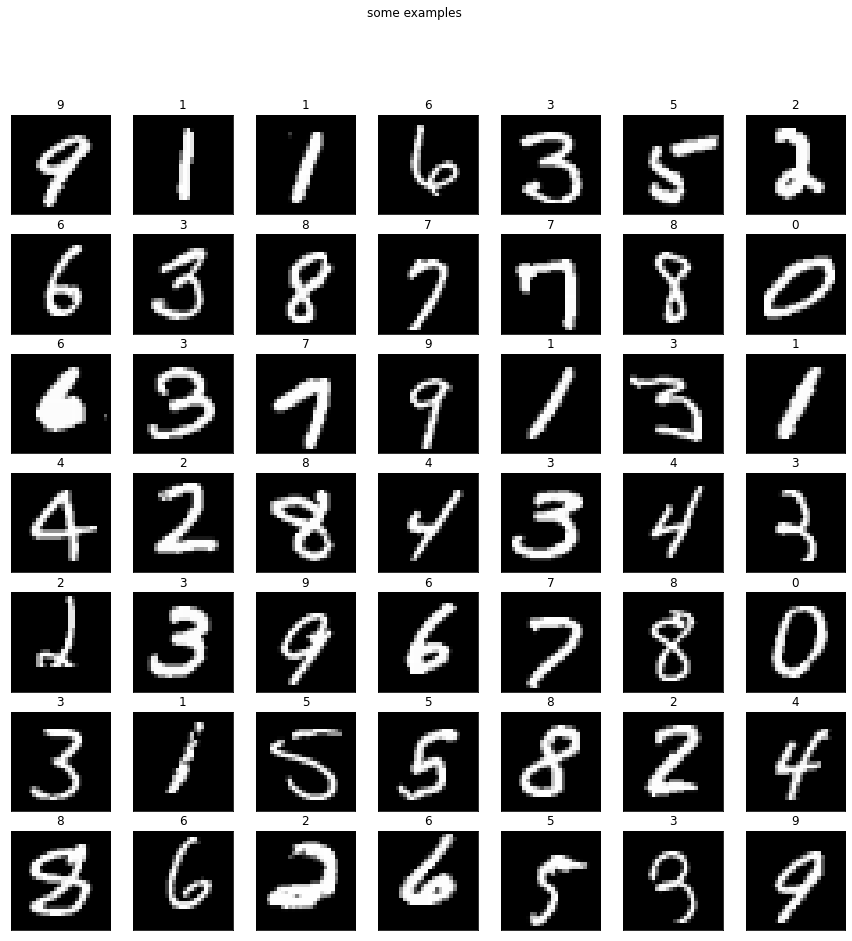

In [11]:
# let's plot some examples
indices = np.random.choice(70000, size=49, replace=False)

plt.figure(figsize=(15, 15))
for i, idx in enumerate(indices):
    plt.subplot(7, 7, i+1)
    plt.imshow(pictures[idx], cmap='gray')
    plt.xticks([])
    plt.yticks([])
    plt.title(labels[idx].item())

plt.suptitle('some examples')
plt.show()

### Defining models and hyperparameters

In [12]:
device = 'cuda:0'
c = 64
lr = 0.0002
beta1 = 0.2
batch_size = 128
itersG = 1
itersD = 1

G = Generator(64).to(device)
D = Discriminator(64).to(device)


optG = Adam(G.parameters(), lr=lr, betas=(beta1, 0.999))
optD = Adam(D.parameters(), lr=lr, betas=(beta1, 0.999))
schG = MultiStepLR(optG, [500, 800, 1200, 1600, 2000, 2300, 3000], 0.85)
schD = MultiStepLR(optD, [500, 800, 1200, 1600, 2000, 2300, 3000], 0.85)

In [13]:
# 4000 iterations with 128 bs correspond to ~7 epochs, 
# with .63 coverage (due to bootstrapping)
# this corresponds to each example being passed to the model at leats 4 times
if RUN_TRAINING:
    train_lossG, train_lossD, test_samples = train_gan(4000, pictures, G, D, optG, optD, schG, schD,
                                                       itersG, itersD, batch_size=batch_size)

In [14]:
if RUN_TRAINING:
    # save the generator to use further
    torch.save(G.state_dict(), 'generator_weights.pt')

    # stack images in each batch of test_samples
    # into a big image of shape [56, 84] to make animating easier
    test_samples = torch.stack(test_samples)
    test_samples = torch.cat([test_samples[:, :3, ...], test_samples[:, 3:, ...]], dim=3)
    test_samples = torch.cat([test_samples[:, i, ...] for i in range(3)], dim=-1)
    torch.save(test_samples, 'test_samples_gan.pt')
else:
    G.load_state_dict(torch.load('generator_weights.pt'))

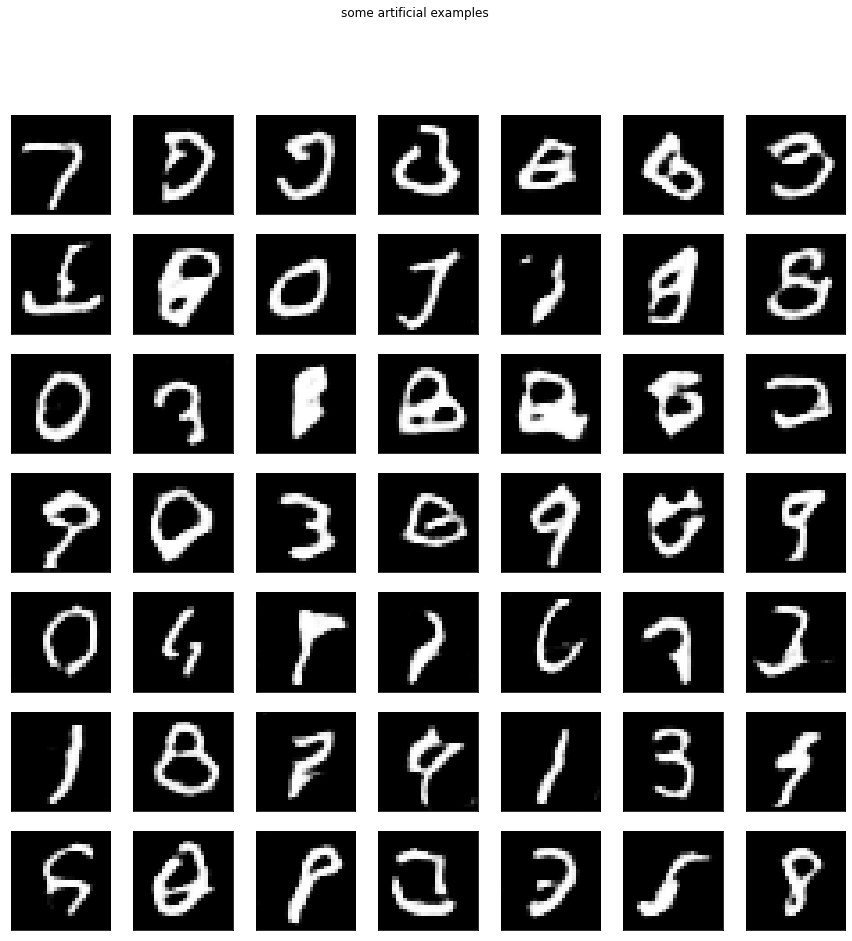

In [15]:
    
# plot some artificial images
G.eval()
test_batch = sample_noise_batch(49)
imgs = G(test_batch).cpu().detach().numpy()
plt.figure(figsize=(15, 15))
for i in range(49):
    plt.subplot(7, 7, i+1)
    plt.imshow(imgs[i].squeeze(), cmap='gray')
    plt.xticks([])
    plt.yticks([])

plt.suptitle('some artificial examples')
plt.show()

The generator in some cases yields images which look like zeros with a dash in the middle and sometimes something like a mirrored 6 or not complete 8. These "zeros" look like 0s and an 8s at the same time, and these "sixes" look like 3s, 8s and 6s at the same time, so they lie close enough to the manifold of MNIST numbers to fool the discriminator. Also this might be due to some inacurrately scribbled digits in the original dataset, there are lots of such examples there.

In [16]:
# animate the improvement of the generated samples 
# during the progress of training

test_samples = torch.load('test_samples_gan.pt')
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i.cpu().detach(), (1,2,0)), animated=True, cmap='gray')] for i in test_samples]
ani = animation.ArtistAnimation(fig, ims, interval=100, repeat_delay=2000, blit=True)
plt.close(fig)

HTML(ani.to_jshtml())

## Task 2

### Part  1

One possible solution here is to use the pretrained generator as the decoder of an autoencoder. In our setting we will train only the encoder from scratch. The architecture of the encoder will be the same as of the discriminator from Task 1 but with 128 output channels in the linear layer and a batch norm instead of sigmoid applied to the output of the linear layer. As the loss function we will use pixel-level MSE.

In [17]:
class Encoder(nn.Module):
    def __init__(self, c=64):
        super(Encoder, self).__init__()
        self.c = c
        self.lin = nn.Linear(4 * 4 * 4*c, 128)
        self.bn = nn.BatchNorm1d(128)
        self.convnet = nn.Sequential(
            nn.Conv2d(1, 2*c, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            ConvBlock(2*c, 2*c),
            ConvBlock(2*c, 4*c),
        )
    
    def forward(self, x):
        x = self.convnet(x).view(-1, 4 * 4 * 4*self.c)
        return self.bn(self.lin(x))

In [18]:
# here the optimizer and the scheduler will work
# on the encoder parameters only

def train_autoencoder(num_iters, images, encoder, decoder, optimizer, scheduler, batch_size=64):
    train_loss = []
    criterion = nn.MSELoss()
    test_images = sample_data_batch(6, images)
    test_samples = []
    
    decoder.eval()
    for it in tqdm(range(num_iters)):
        encoder.train()
        optimizer.zero_grad()
        # sample real images and add noise
        real_images = sample_data_batch(batch_size, images)
        real_images += (torch.rand(real_images.size()).to(device) - 0.5) * 0.4 / np.log(it+100)
        # forward pass, loss computation and backward pass
        encoded_images = encoder(real_images)
        decoded_images = decoder(encoded_images)
        loss = criterion(real_images, decoded_images)
        loss.backward()
        optimizer.step()
        
        train_loss.append(loss.item())
            
        
        if scheduler is not None:
            scheduler.step()
        
        # plot an original image and its restored version and loss
        if it % 50 == 0:
            encoder.eval()
            test_samples.append(decoder(encoder(test_images)).detach().cpu())
            sample_images = sample_data_batch(1, images)
            sample_restored = decoder(encoder(sample_images)).detach().cpu()
            clear_output(wait=True)
            plt.figure(figsize=(18, 6))
            plt.subplot(1, 3, 1)
            plt.imshow(sample_images.squeeze().detach().cpu(), cmap='gray')
            plt.xticks([])
            plt.yticks([])
            plt.subplot(1, 3, 2)
            plt.imshow(sample_restored.squeeze(), cmap='gray')
            plt.xticks([])
            plt.yticks([])
            plt.subplot(1, 3, 3)
            plt.plot(train_loss, label='Loss')
            plt.ylim(0, 7)
            plt.title('Loss')
            plt.xlabel('num_iters')
            plt.ylabel('loss')
            plt.legend()
            plt.show()
        
    return train_loss, test_samples
                
            

In [19]:
device = 'cuda:0'
c = 64
lr = 0.0002
batch_size = 128

encoder = Encoder().to(device)
# load the trained generator from Task 1 and use it as a decoder
decoder = Generator().to(device)
decoder.load_state_dict(torch.load('generator_weights.pt'))

optimizer = Adam(encoder.parameters(), lr=lr)
scheduler = MultiStepLR(optimizer, [500, 800, 1200, 1600, 2000, 2300, 3000], 0.85)

In [20]:
if RUN_TRAINING:
    train_loss, test_samples = train_autoencoder(10000, pictures, encoder, decoder, optimizer, scheduler, batch_size=64)

In [21]:
if RUN_TRAINING:
    # save the encoder
    torch.save(encoder.state_dict(), 'encoder_weights.pt')

    test_samples = torch.stack(test_samples)
    test_samples = torch.cat([test_samples[:, :3, ...], test_samples[:, 3:, ...]], dim=3)
    test_samples = torch.cat([test_samples[:, i, ...] for i in range(3)], dim=-1)
    torch.save(test_samples, 'test_samples_autoencoder.pt')
else:
    encoder.load_state_dict(torch.load('encoder_weights.pt'))

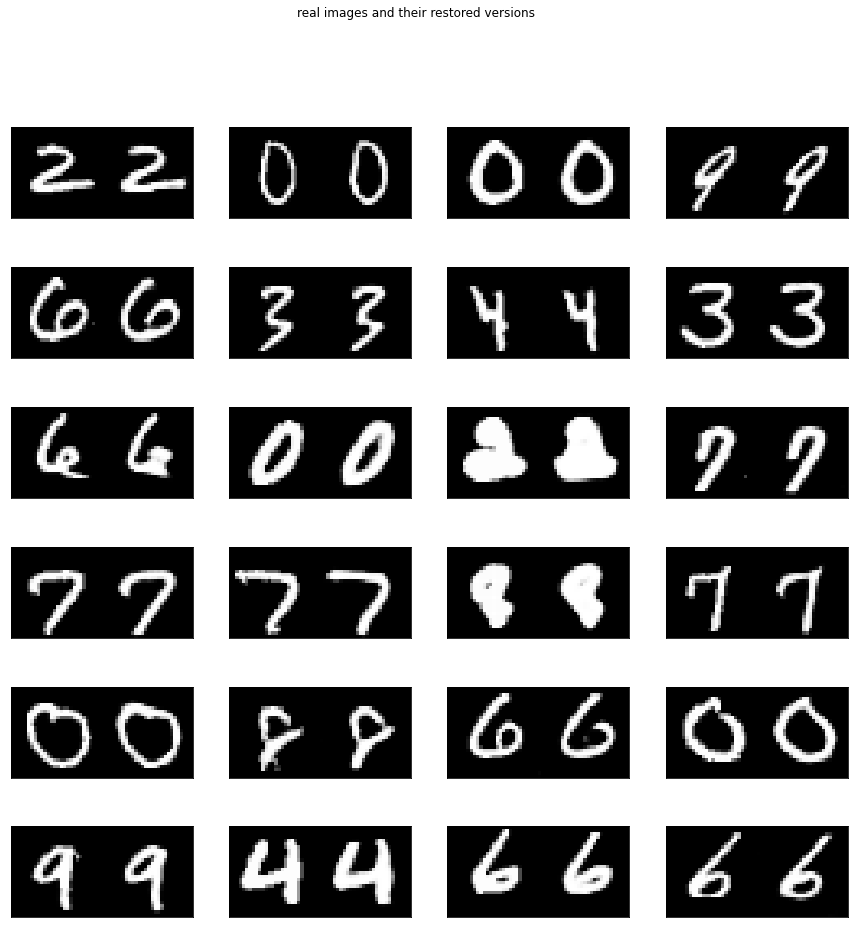

In [22]:
# let's compare real images with their generated counterparts
encoder.eval()
decoder.eval()
test_batch = sample_data_batch(24, pictures)
restored_batch = decoder(encoder(test_batch))
imgs = torch.cat([test_batch, restored_batch], dim=-1).detach().cpu()
plt.figure(figsize=(15, 15))
for i in range(24):
    plt.subplot(6, 4, i+1)
    plt.imshow(imgs[i].squeeze(), cmap='gray')
    plt.xticks([])
    plt.yticks([])

plt.suptitle('real images and their restored versions')
plt.show()

Looks great!

__Note:__ After the Part 2 there are some additions to this approach.

In [23]:
# animate the improvement of the restored samples 
# during the progress of training

test_samples = torch.load('test_samples_autoencoder.pt')
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i.cpu().detach(), (1,2,0)), animated=True, cmap='gray')] for i in test_samples]
ani = animation.ArtistAnimation(fig, ims, interval=100, repeat_delay=2000, blit=True)
plt.close(fig)

HTML(ani.to_jshtml())

### Part 2

One solution here might be the following iterative process: 

1. Initialize a random vector $h$
2. Generate an image $G(h)$
3. Compute loss $L(x, G(h))$
4. Backprop and compute the gradient w.r.t. $h$
5. Update $h$

In [24]:
device = 'cuda:0'

# load the trained generator from Task 1
G = Generator().to(device)
G.load_state_dict(torch.load('generator_weights.pt'))
lr = 0.0002

### First version

In [25]:
def optimize_h(G, image, num_iters=1000, base_lr=1):
    h = torch.randn(1, 128, requires_grad=True).to(device)
    h.retain_grad() # h is not a leaf node, grad is not saved by default
    criterion = nn.MSELoss() # use MSE here as well
    
    for it in range(num_iters):
        lr = base_lr / int((it / 100)) if it > 100 else base_lr # lr decay
        # forward pass
        generated_image = G(h)
        loss = criterion(generated_image, image)
        loss.backward()
        # gradient step for h
        h -= lr * h.grad
        h.retain_grad()
        
    return h

  0%|          | 0/24 [00:00<?, ?it/s]/opt/conda/lib/python3.7/site-packages/torch/nn/modules/loss.py:445: UserWarning: Using a target size (torch.Size([1, 28, 28])) that is different to the input size (torch.Size([1, 1, 28, 28])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
100%|██████████| 24/24 [02:15<00:00,  5.63s/it]


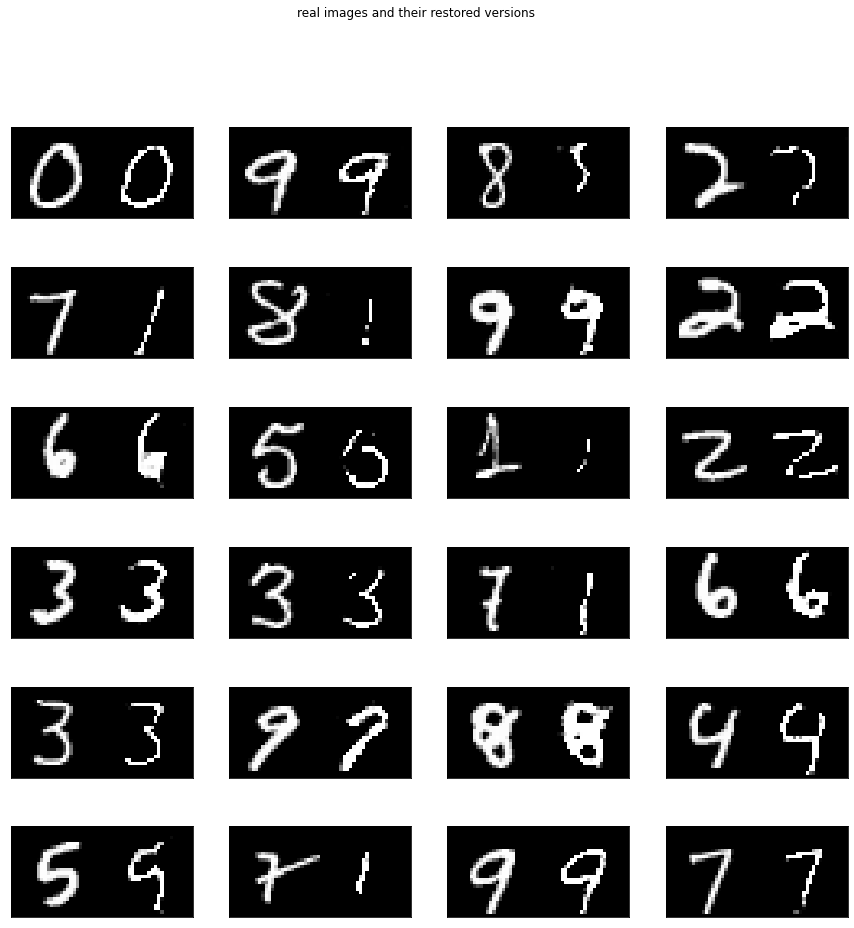

In [26]:
# sample 24 images, optimize h for each of them and then plot
# the images and their restored versions side by side
criterion = nn.MSELoss()
G.eval()
test_batch = sample_data_batch(24, pictures)
restored_images = []
for img in tqdm(test_batch):
    h = optimize_h(G, img)
    restored_images.append(G(h))

restored_images = torch.stack(restored_images)

imgs = torch.cat([test_batch.squeeze(), restored_images.squeeze()], dim=-1).detach().cpu()
plt.figure(figsize=(15, 15))
for i in range(24):
    plt.subplot(6, 4, i+1)
    plt.imshow(imgs[i].squeeze(), cmap='gray')
    plt.xticks([])
    plt.yticks([])

plt.suptitle('real images and their restored versions')
plt.show()

The numbers are right in most cases, but for some cases the algorithm fails, outputing an image with only parts of the number. Also, the restored image look not loke the images which are generated by a generator when normal noise is used as input. It gave me an idea that the vector $h$ does not belong to the unit gaussian after the optimization. It makes sense to somehow force it to stay in the normal distribution. One way for it is to add another term to the loss function which would measure the "distance" between the distribution of coordinates in $h$ and the unit gaussian. I tried using Kullback–Leibler divergence.

### Second version

In [27]:
# KL Divergence between a sample and a unit gaussian
def KL_divergence(h):
    mu = h.mean(dim=-1)
    logsigma = h.std(dim=-1).log()
    return -0.5 * (1 + 2*logsigma - mu.pow(2) - (2*logsigma).exp()).sum(dim=-1)

In [28]:
def optimize_h(G, image, num_iters=1000, base_lr=1):
    h = torch.randn(1, 128, requires_grad=True).to(device)
    h.retain_grad() # h is not a leaf node, grad is not saved by default
    criterion = nn.MSELoss() # use MSE here as well
    
    for it in range(num_iters):
        lr = base_lr / int((it / 100)) if it > 100 else base_lr # lr decay
        # forward pass
        generated_image = G(h)
        # add the term with KL div with a balancing coefficient
        # which was tuned by trial and error
        loss = criterion(generated_image, image) + 3 * KL_divergence(h)
        loss.backward()
        # gradient step for h
        h -= lr * h.grad
        h.retain_grad()
        
    return h

100%|██████████| 24/24 [02:52<00:00,  7.18s/it]


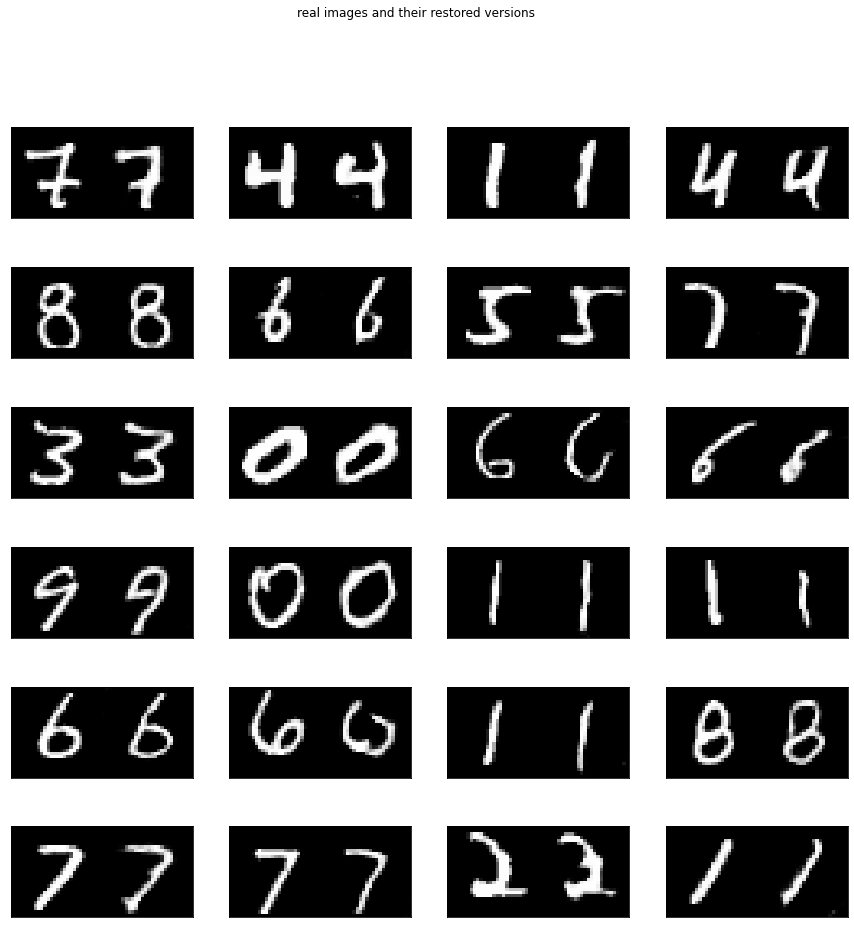

In [29]:
# sample 24 images, optimize h for each of them and then plot
# the images and their restored versions side by side
G.eval()
test_batch = sample_data_batch(24, pictures)
restored_images = []
for img in tqdm(test_batch):
    h = optimize_h(G, img)
    restored_images.append(G(h))

restored_images = torch.stack(restored_images)

imgs = torch.cat([test_batch.squeeze(), restored_images.squeeze()], dim=-1).detach().cpu()
plt.figure(figsize=(15, 15))
for i in range(24):
    plt.subplot(6, 4, i+1)
    plt.imshow(imgs[i].squeeze(), cmap='gray')
    plt.xticks([])
    plt.yticks([])

plt.suptitle('real images and their restored versions')
plt.show()

Yep, much better.

### Back to Part 1

Maybe adding such a term to our autoencoder training process will help too? Let's check. All code is the same as for the vanilla autoencoder, except for the KL term in the loss. 
* In [this](https://arxiv.org/pdf/1511.08861.pdf) paper the authors show that the use of MSE results in noise in the flat regions. The solution was to use a mixture of SSIM and other losses, one of them is MAE.
* The final addition was using KL divergence and SSIM as additional terms in the loss.  To not make the notebook very long I show only the final variant
* SSIM implementation was taken from [here](https://github.com/Po-Hsun-Su/pytorch-ssim).

In [30]:
# this is a copy of SSIM implementation by Po-Hsun-Su

import torch
import torch.nn.functional as F
from torch.autograd import Variable
import numpy as np
from math import exp

def gaussian(window_size, sigma):
    gauss = torch.Tensor([exp(-(x - window_size//2)**2/float(2*sigma**2)) for x in range(window_size)])
    return gauss/gauss.sum()

def create_window(window_size, channel):
    _1D_window = gaussian(window_size, 1.5).unsqueeze(1)
    _2D_window = _1D_window.mm(_1D_window.t()).float().unsqueeze(0).unsqueeze(0)
    window = Variable(_2D_window.expand(channel, 1, window_size, window_size).contiguous())
    return window

def _ssim(img1, img2, window, window_size, channel, size_average = True):
    mu1 = F.conv2d(img1, window, padding = window_size//2, groups = channel)
    mu2 = F.conv2d(img2, window, padding = window_size//2, groups = channel)

    mu1_sq = mu1.pow(2)
    mu2_sq = mu2.pow(2)
    mu1_mu2 = mu1*mu2

    sigma1_sq = F.conv2d(img1*img1, window, padding = window_size//2, groups = channel) - mu1_sq
    sigma2_sq = F.conv2d(img2*img2, window, padding = window_size//2, groups = channel) - mu2_sq
    sigma12 = F.conv2d(img1*img2, window, padding = window_size//2, groups = channel) - mu1_mu2

    C1 = 0.01**2
    C2 = 0.03**2

    ssim_map = ((2*mu1_mu2 + C1)*(2*sigma12 + C2))/((mu1_sq + mu2_sq + C1)*(sigma1_sq + sigma2_sq + C2))

    if size_average:
        return ssim_map.mean()
    else:
        return ssim_map.mean(1).mean(1).mean(1)

class SSIM(torch.nn.Module):
    def __init__(self, window_size = 11, size_average = True):
        super(SSIM, self).__init__()
        self.window_size = window_size
        self.size_average = size_average
        self.channel = 1
        self.window = create_window(window_size, self.channel)

    def forward(self, img1, img2):
        (_, channel, _, _) = img1.size()

        if channel == self.channel and self.window.data.type() == img1.data.type():
            window = self.window
        else:
            window = create_window(self.window_size, channel)
            
            if img1.is_cuda:
                window = window.cuda(img1.get_device())
            window = window.type_as(img1)
            
            self.window = window
            self.channel = channel


        return _ssim(img1, img2, window, self.window_size, channel, self.size_average)

def ssim(img1, img2, window_size = 11, size_average = True):
    (_, channel, _, _) = img1.size()
    window = create_window(window_size, channel)
    
    if img1.is_cuda:
        window = window.cuda(img1.get_device())
    window = window.type_as(img1)
    
    return _ssim(img1, img2, window, window_size, channel, size_average)

In [31]:
# here the optimizer and the scheduler will work
# on the encoder parameters only

def train_autoencoder_with_kl_and_SSIM(num_iters, images, encoder, decoder, optimizer, scheduler, batch_size=64):
    train_loss = []
    criterion = nn.MSELoss()
    criterion_SSIM = SSIM(window_size=3) # the default window size 11 is too large for MNIST
    test_images = sample_data_batch(6, images)
    test_samples = []
    
    decoder.eval()
    for it in tqdm(range(num_iters)):
        encoder.train()
        optimizer.zero_grad()
        # sample real images and add noise
        real_images = sample_data_batch(batch_size, images)
        real_images += (torch.rand(real_images.size()).to(device) - 0.5) * 0.4 / np.log(it+100)
        # forward pass, loss computation and backward pass
        encoded_images = encoder(real_images)
        decoded_images = decoder(encoded_images)
        loss = criterion(real_images, decoded_images) + 3 * KL_divergence(encoded_images).mean() \
                                            +  (1 - criterion_SSIM(real_images, decoded_images))
        loss.backward()
        optimizer.step()
        
        train_loss.append(loss.item())
            
        
        if scheduler is not None:
            scheduler.step()
        
        # plot an original image and its restored version and loss
        if it % 50 == 0:
            encoder.eval()
            test_samples.append(decoder(encoder(test_images)).detach().cpu())
            sample_images = sample_data_batch(1, images)
            sample_restored = decoder(encoder(sample_images)).detach().cpu()
            clear_output(wait=True)
            plt.figure(figsize=(18, 6))
            plt.subplot(1, 3, 1)
            plt.imshow(sample_images.squeeze().detach().cpu(), cmap='gray')
            plt.xticks([])
            plt.yticks([])
            plt.subplot(1, 3, 2)
            plt.imshow(sample_restored.squeeze(), cmap='gray')
            plt.xticks([])
            plt.yticks([])
            plt.subplot(1, 3, 3)
            plt.plot(train_loss, label='Loss')
            plt.ylim(0, 7)
            plt.title('Loss')
            plt.xlabel('num_iters')
            plt.ylabel('loss')
            plt.legend()
            plt.show()
        
    return train_loss, test_samples
                
            

In [32]:
device = 'cuda:0'
c = 64
lr = 0.0002
batch_size = 128

encoder = Encoder().to(device)
# load the trained generator from Task 1 and use it as a decoder
decoder = Generator().to(device)
decoder.load_state_dict(torch.load('generator_weights.pt'))

optimizer = Adam(encoder.parameters(), lr=lr)
scheduler = MultiStepLR(optimizer, [500, 800, 1200, 1600, 2000, 2300, 3000], 0.85)

In [33]:
if RUN_TRAINING:
    train_loss, test_samples = train_autoencoder_with_kl_and_SSIM(10000, pictures, encoder, decoder, optimizer, scheduler, batch_size=64)

In [34]:
if RUN_TRAINING:
    # save the encoder 
    torch.save(encoder.state_dict(), 'improved_encoder_weights.pt')

    test_samples = torch.stack(test_samples)
    test_samples = torch.cat([test_samples[:, :3, ...], test_samples[:, 3:, ...]], dim=3)
    test_samples = torch.cat([test_samples[:, i, ...] for i in range(3)], dim=-1)
    torch.save(test_samples, 'test_samples_improved_autoencoder.pt')
else:
    encoder.load_state_dict(torch.load('improved_encoder_weights.pt'))

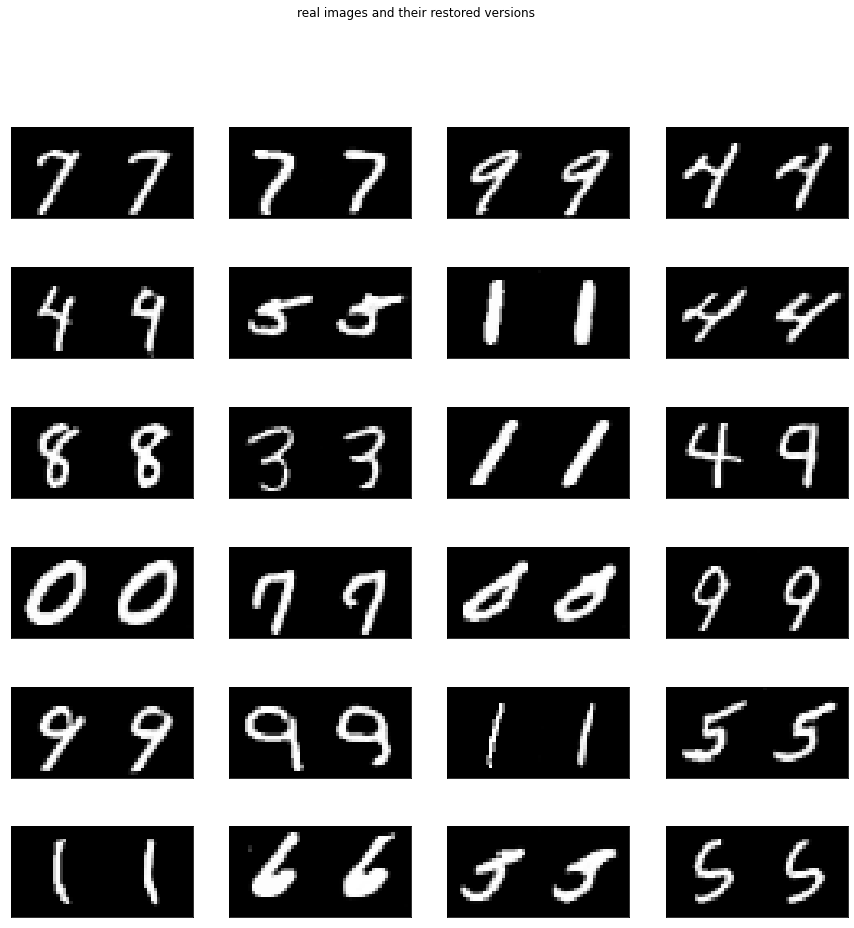

In [35]:
# let's compare real images with their generated counterparts
encoder.eval()
decoder.eval()
test_batch = sample_data_batch(24, pictures)
restored_batch = decoder(encoder(test_batch))
imgs = torch.cat([test_batch, restored_batch], dim=-1).detach().cpu()
plt.figure(figsize=(15, 15))
for i in range(24):
    plt.subplot(6, 4, i+1)
    plt.imshow(imgs[i].squeeze(), cmap='gray')
    plt.xticks([])
    plt.yticks([])

plt.suptitle('real images and their restored versions')
plt.show()

The results are roughly the same, maybe even a little bit worse.

In [36]:
# animate the improvement of the restored samples 
# during the progress of training

test_samples = torch.load('test_samples_improved_autoencoder.pt')
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i.cpu().detach(), (1,2,0)), animated=True, cmap='gray')] for i in test_samples]
ani = animation.ArtistAnimation(fig, ims, interval=100, repeat_delay=2000, blit=True)
plt.close(fig)

HTML(ani.to_jshtml())

# _That's all, folks!_